# Imports

In [1]:
## Essential Imports: 
import os
import numpy as np
from pathlib import Path
from pzflow.examples import get_galaxy_data
import tables_io

## RAIL-Specific Imports: 
import rail
from rail.creation.degradation import LSSTErrorModel, InvRedshiftIncompleteness
from rail.creation.engines.flowEngine import FlowModeler, FlowCreator, FlowPosterior
from rail.core.data import TableHandle
from rail.core.stage import RailStage
from rail.core.utilStages import ColumnMapper, TableConverter

from rail.estimation.algos.flexzboost import Inform_FZBoost, FZBoost

from rail.evaluation.evaluator import Evaluator

## Data Storage: 
DS = RailStage.data_store
DS.__class__.allow_overwrite = True

## Data Formatting: (from different codes) 
from rail.core.utils import RAILDIR
flow_file = os.path.join(RAILDIR, 'examples/goldenspike/data/pretrained_flow.pkl')
bands = ['u','g','r','i','z','y']
band_dict = {band:f'mag_{band}_lsst' for band in bands}
rename_dict = {f'mag_{band}_lsst_err':f'mag_err_{band}_lsst' for band in bands}

import rail
from rail.evaluation.metrics.cdeloss import *
from rail.evaluation.evaluator import Evaluator
from rail.core.data import QPHandle, TableHandle
from rail.core.stage import RailStage
#from rail.evaluation.utils import plot_pit_qq, ks_plot
import qp 
import os
%matplotlib inline
%reload_ext autoreload
%autoreload 2

DS = RailStage.data_store
DS.__class__.allow_overwrite = True

# Set up Flow Engine 

In [2]:
#path to access the data 
DATA_DIR = Path().resolve() / "data"
DATA_DIR.mkdir(exist_ok=True)

catalog_file = DATA_DIR / "base_catalog.pq"

#array of 100,000 galaxies w/ 7 attributes for each: redshift & ugrizy
catalog = get_galaxy_data().rename(band_dict, axis=1) 

#turns array into a table 
tables_io.write(catalog, str(catalog_file.with_suffix("")), catalog_file.suffix[1:])

catalog_file = str(catalog_file)
flow_file = str(DATA_DIR / "trained_flow.pkl")

#we set up the stage 
flow_modeler_params = {
    "name": "flow_modeler",
    "input": catalog_file,
    "model": flow_file,
    "seed": 0,
    "phys_cols": {"redshift": [0, 3]},
    "phot_cols": {
        "mag_u_lsst": [17, 35],
        "mag_g_lsst": [16, 32],
        "mag_r_lsst": [15, 30],
        "mag_i_lsst": [15, 30],
        "mag_z_lsst": [14, 29],
        "mag_y_lsst": [14, 28],
    },
    "calc_colors": {"ref_column_name": "mag_i_lsst"},
}

#we make the stage
flow_modeler = FlowModeler.make_stage(**flow_modeler_params)

#we use the stage to make a model 
flow_modeler.fit_model()

#now we have a model; the next thing to do is to pull datasets from it (and degrade them)

Inserting handle into data store.  input: /Users/alicec03/Desktop/Summer_Research/Photo-z-Stress-Test/Photo-z-Stress-Test/data/base_catalog.pq, flow_modeler
Training 30 epochs 
Loss:
(0) 21.3266
(1) 6.7267
(2) 2.0761
(3) 2.6037
(4) -0.0680
(5) 0.4129
(6) 0.2506
(7) 0.1637
(8) -1.3346
(9) -1.7669
(10) -1.1823
(11) -1.6267
(12) 3402823273761818485311871060541440.0000
(13) 3402823273761818485311871060541440.0000
(14) -1.0711
(15) -0.6228
(16) 3402823273761818485311871060541440.0000
(17) 3402823273761818485311871060541440.0000
(18) -2.8045
(19) -3.3746
(20) 3402823273761818485311871060541440.0000
(21) -2.4881
(22) -3.2147
(23) -3.7188
(24) -3.4398
(25) -3.7955
(26) -3.3772
(27) 3402823273761818485311871060541440.0000
(28) -3.5247
(29) -4.1677
(30) -3.4874
Inserting handle into data store.  model_flow_modeler: /Users/alicec03/Desktop/Summer_Research/Photo-z-Stress-Test/Photo-z-Stress-Test/data/inprogress_trained_flow.pkl, flow_modeler


# Make Datasets

In [3]:
flow_modeler.get_handle("model")

In [85]:
flow_creator = FlowCreator.make_stage(
    name='flow_creator', 
    model=flow_modeler.get_handle("model"), 
    n_samples=100000,
    seed=1864,
)

#an un-degraded dataset containing 100,000 galaxies
orig_data = flow_creator.sample(100000, 1864)

# the inverse redshift degrader stage
inv_redshift = InvRedshiftIncompleteness.make_stage(
    name='inv_redshift',
    pivot_redshift=1.0,
)

#degraded dataset, using inverse redshift degrader 
deg_data = inv_redshift(orig_data)

Inserting handle into data store.  output_flow_creator: inprogress_output_flow_creator.pq, flow_creator
Inserting handle into data store.  output_inv_redshift: inprogress_output_inv_redshift.pq, inv_redshift


# Posteriors

In [86]:
flow_post_orig = FlowPosterior.make_stage(name='truth_post_orig', 
                                             column='redshift',
                                             grid = np.linspace(0, 2.5, 100),
                                             model=flow_file,
                                             data = orig_data)

orig_pdfs = flow_post_orig.get_posterior(orig_data, column='redshift')

Inserting handle into data store.  output_truth_post_orig: inprogress_output_truth_post_orig.hdf5, truth_post_orig


In [87]:
flow_post_deg = FlowPosterior.make_stage(name='truth_post_deg', 
                                             column='redshift',
                                             grid = np.linspace(0, 2.5, 100),
                                             model=flow_file,
                                             data = deg_data)

deg_pdfs = flow_post_deg.get_posterior(deg_data, column='redshift')

Inserting handle into data store.  output_truth_post_deg: inprogress_output_truth_post_deg.hdf5, truth_post_deg


# Tables 

In [88]:
col_remapper = ColumnMapper.make_stage(
    name='col_remapper', 
    columns=rename_dict,
)
   
table_conv = TableConverter.make_stage(
    name='table_conv', 
    output_format='numpyDict',
)

In [89]:
orig_pq = col_remapper(orig_data)
orig_pq_data = table_conv(orig_pq)

orig_table = tables_io.convertObj(orig_pq_data.data, tables_io.types.PD_DATAFRAME)
orig_table

Inserting handle into data store.  output_col_remapper: inprogress_output_col_remapper.pq, col_remapper
Inserting handle into data store.  output_table_conv: inprogress_output_table_conv.hdf5, table_conv


,redshift,mag_u_lsst,mag_g_lsst,mag_r_lsst,mag_i_lsst,mag_z_lsst,mag_y_lsst
0,0.980219,28.717247,28.043226,26.935120,25.974754,25.262276,24.988197
1,0.336962,26.750130,26.237349,25.686253,25.562122,25.426531,25.483788
2,1.058445,26.427927,26.156200,25.467705,24.669821,23.986652,23.638468
3,2.084974,26.465586,26.245998,25.998940,25.914877,25.679785,25.399582
4,1.710162,28.261900,27.878426,27.499338,27.101761,26.561159,26.140568
...,...,...,...,...,...,...,...
99995,0.822037,24.565582,24.334368,23.870855,23.159513,22.798336,22.726400
99996,1.456850,25.806974,25.552200,25.456583,25.204376,25.052702,24.601746
99997,2.011781,29.545815,28.386770,27.457928,27.118486,26.261799,25.521345
99998,0.626923,24.771667,23.945906,22.953171,22.189484,21.942114,21.764332


In [90]:
deg_pq = col_remapper(deg_data)
deg_pq_data = table_conv(deg_pq)

deg_table = tables_io.convertObj(deg_pq_data.data, tables_io.types.PD_DATAFRAME)
deg_table

Inserting handle into data store.  output_col_remapper: inprogress_output_col_remapper.pq, col_remapper
Inserting handle into data store.  output_table_conv: inprogress_output_table_conv.hdf5, table_conv


,redshift,mag_u_lsst,mag_g_lsst,mag_r_lsst,mag_i_lsst,mag_z_lsst,mag_y_lsst
0,0.980219,28.717247,28.043226,26.935120,25.974754,25.262276,24.988197
1,0.336962,26.750130,26.237349,25.686253,25.562122,25.426531,25.483788
2,1.058445,26.427927,26.156200,25.467705,24.669821,23.986652,23.638468
3,1.710162,28.261900,27.878426,27.499338,27.101761,26.561159,26.140568
4,1.049813,26.405678,25.780752,24.689110,23.941168,23.117826,22.752045
...,...,...,...,...,...,...,...
83101,0.822037,24.565582,24.334368,23.870855,23.159513,22.798336,22.726400
83102,1.456850,25.806974,25.552200,25.456583,25.204376,25.052702,24.601746
83103,2.011781,29.545815,28.386770,27.457928,27.118486,26.261799,25.521345
83104,0.626923,24.771667,23.945906,22.953171,22.189484,21.942114,21.764332


# Inform & Estimate on Original Data 

In [91]:
inform_fzboost_orig = Inform_FZBoost.make_stage(
    name='inform_FZBoost_orig', 
    model='fzboost.pkl', 
    hdf5_groupname='',
)

inform_fzboost_orig.inform(orig_data)

stacking some data...
read in training data
fit the model...
[16:42:34] WARNING: /private/var/folders/jl/5jxwvx_x5q364l56c4qph1g00000gn/T/pip-install-eeaedq5e/xgboost_e2bb7fd5d4194af8881e01ff690195d0/build/temp.macosx-11.0-arm64-cpython-310/xgboost/src/learner.cc:767: 
Parameters: { "silent" } are not used.

[16:42:34] WARNING: /private/var/folders/jl/5jxwvx_x5q364l56c4qph1g00000gn/T/pip-install-eeaedq5e/xgboost_e2bb7fd5d4194af8881e01ff690195d0/build/temp.macosx-11.0-arm64-cpython-310/xgboost/src/learner.cc:767: 
Parameters: { "silent" } are not used.

[16:42:34] WARNING: /private/var/folders/jl/5jxwvx_x5q364l56c4qph1g00000gn/T/pip-install-eeaedq5e/xgboost_e2bb7fd5d4194af8881e01ff690195d0/build/temp.macosx-11.0-arm64-cpython-310/xgboost/src/learner.cc:767: 
Parameters: { "silent" } are not used.

[16:42:34] WARNING: /private/var/folders/jl/5jxwvx_x5q364l56c4qph1g00000gn/T/pip-install-eeaedq5e/xgboost_e2bb7fd5d4194af8881e01ff690195d0/build/temp.macosx-11.0-arm64-cpython-310/xgboost/src/

NOTE/WARNING: Expected output file fzboost.pkl was not generated.


In [92]:
## use estimator (informed on orig) on orig 

estimate_fzboost_orig_orig = FZBoost.make_stage(
    name='est_fzboost_o_o', 
    nondetect_val=np.nan,
    model=inform_fzboost_orig.get_handle('model'), 
    hdf5_groupname='',
    aliases=dict(input='test_data', output='fzboost_estim'),
    nzbins = 100 ,
    zmax = 2.5
)

estimate_fzboost_orig_orig.estimate(orig_data)

Process 0 running estimator on chunk 0 - 100000
Process 0 estimating PZ PDF for rows 0 - 100,000
Inserting handle into data store.  output_est_fzboost_o_o: inprogress_output_est_fzboost_o_o.hdf5, est_fzboost_o_o


In [93]:
## use estimator (informed on orig) on deg 

estimate_fzboost_orig_deg = FZBoost.make_stage(
    name='est_fzboost_o_d', 
    nondetect_val=np.nan,
    model=inform_fzboost_orig.get_handle('model'), 
    hdf5_groupname='',
    aliases=dict(input='test_data', output='fzboost_estim'),
    nzbins = 100 ,
    zmax = 2.5
)

estimate_fzboost_orig_deg.estimate(deg_data)

Process 0 running estimator on chunk 0 - 83106
Process 0 estimating PZ PDF for rows 0 - 83,106


/Users/alicec03/miniforge3/envs/rail/lib/python3.10/site-packages/rail/estimation/algos/flexzboost.py:212: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data.loc[detmask, errname] = 1.0
/Users/alicec03/miniforge3/envs/rail/lib/python3.10/site-packages/rail/estimation/algos/flexzboost.py:212: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data.loc[detmask, errname] = 1.0
/Users/alicec03/miniforge3/envs/rail/lib/python3.10/site-packages/rail/estimation/algos/flexzboost.py:212: SettingWithCopyWarning: 
A value 

Inserting handle into data store.  output_est_fzboost_o_d: inprogress_output_est_fzboost_o_d.hdf5, est_fzboost_o_d


# Inform & Estimate on Degraded Data 

In [94]:
inform_fzboost_deg = Inform_FZBoost.make_stage(
    name='inform_FZBoost_deg', 
    model='fzboost.pkl', 
    hdf5_groupname='',
)

inform_fzboost_deg.inform(deg_data)

stacking some data...
read in training data
fit the model...
[16:50:37] WARNING: /private/var/folders/jl/5jxwvx_x5q364l56c4qph1g00000gn/T/pip-install-eeaedq5e/xgboost_e2bb7fd5d4194af8881e01ff690195d0/build/temp.macosx-11.0-arm64-cpython-310/xgboost/src/learner.cc:767: 
Parameters: { "silent" } are not used.

[16:50:37] WARNING: /private/var/folders/jl/5jxwvx_x5q364l56c4qph1g00000gn/T/pip-install-eeaedq5e/xgboost_e2bb7fd5d4194af8881e01ff690195d0/build/temp.macosx-11.0-arm64-cpython-310/xgboost/src/learner.cc:767: 
Parameters: { "silent" } are not used.

[16:50:37] WARNING: /private/var/folders/jl/5jxwvx_x5q364l56c4qph1g00000gn/T/pip-install-eeaedq5e/xgboost_e2bb7fd5d4194af8881e01ff690195d0/build/temp.macosx-11.0-arm64-cpython-310/xgboost/src/learner.cc:767: 
Parameters: { "silent" } are not used.

[16:50:37] WARNING: /private/var/folders/jl/5jxwvx_x5q364l56c4qph1g00000gn/T/pip-install-eeaedq5e/xgboost_e2bb7fd5d4194af8881e01ff690195d0/build/temp.macosx-11.0-arm64-cpython-310/xgboost/src/

NOTE/WARNING: Expected output file fzboost.pkl was not generated.


In [95]:
## use estimator (informed on deg) on orig 

estimate_fzboost_deg_orig = FZBoost.make_stage(
    name='est_fzboost_d_o', 
    nondetect_val=np.nan,
    model=inform_fzboost_deg.get_handle('model'), 
    hdf5_groupname='',
    aliases=dict(input='test_data', output='fzboost_estim'),
    nzbins = 100 ,
    zmax = 2.5
)

estimate_fzboost_deg_orig.estimate(orig_data)

Process 0 running estimator on chunk 0 - 100000
Process 0 estimating PZ PDF for rows 0 - 100,000
Inserting handle into data store.  output_est_fzboost_d_o: inprogress_output_est_fzboost_d_o.hdf5, est_fzboost_d_o


In [134]:
## use estimator (informed on deg) on deg 

estimate_fzboost_deg_deg = FZBoost.make_stage(
    name='est_fzboost_d_d', 
    nondetect_val=np.nan,
    model=inform_fzboost_deg.get_handle('model'), 
    hdf5_groupname='',
    aliases=dict(input='test_data', output='fzboost_estim'),
    nzbins = 100 ,
    zmax = 2.5
)

estimate_fzboost_deg_deg.estimate(deg_data)

Process 0 running estimator on chunk 0 - 83106
Process 0 estimating PZ PDF for rows 0 - 83,106


Inserting handle into data store.  output_est_fzboost_d_d: inprogress_output_est_fzboost_d_d.hdf5, est_fzboost_d_d


# Evaluation 

In [96]:
import h5py 
import qp

lims = np.array([0, 2.5])
grid = np.linspace(0, 2.5, 100)

## Info on Orig 

In [107]:
orig_truth_file = DS.read_file('pdfs_data', QPHandle, 'output_truth_post_orig.hdf5')
orig_truth_yvals = orig_truth_file().objdata()['yvals']
orig_truth_xvals = orig_truth_file().metadata()['xvals'][0]
orig_truth_ens = qp.Ensemble(qp.interp, data=dict(xvals=orig_truth_xvals, yvals=orig_truth_yvals))

orig_truth_tuple = [orig_truth_xvals, orig_truth_yvals]

In [108]:
o_o_file = DS.read_file('pdfs_data', QPHandle, 'output_est_fzboost_o_o.hdf5')
o_o_yvals = o_o_file().objdata()['yvals']
o_o_xvals = o_o_file().metadata()['xvals'][0]
o_o_ens = qp.Ensemble(qp.interp, data=dict(xvals=o_o_xvals, yvals=o_o_yvals))

In [109]:
o_d_file = DS.read_file('pdfs_data', QPHandle, 'output_est_fzboost_o_d.hdf5')
o_d_yvals = o_d_file().objdata()['yvals']
o_d_xvals = o_d_file().metadata()['xvals'][0]
o_d_ens = qp.Ensemble(qp.interp, data=dict(xvals=o_d_xvals, yvals=o_d_yvals))

## Info on Deg 

In [100]:
deg_truth_file = DS.read_file('pdfs_data', QPHandle, 'output_truth_post_deg.hdf5')
deg_truth_yvals = deg_truth_file().objdata()['yvals']
deg_truth_xvals = deg_truth_file().metadata()['xvals'][0]
deg_truth_ens = qp.Ensemble(qp.interp, data=dict(xvals=deg_truth_xvals, yvals=deg_truth_yvals))

deg_truth_tuple = [deg_truth_xvals, deg_truth_yvals]

In [101]:
d_o_file = DS.read_file('pdfs_data', QPHandle, 'output_est_fzboost_d_o.hdf5')
d_o_yvals = d_o_file().objdata()['yvals']
d_o_xvals = d_o_file().metadata()['xvals'][0]
d_o_ens = qp.Ensemble(qp.interp, data=dict(xvals=d_o_xvals, yvals=d_o_yvals))

In [139]:
d_d_file = DS.read_file('pdfs_data', QPHandle, 'output_est_fzboost_d_d.hdf5')
d_d_yvals = d_d_file().objdata()['yvals']
d_d_xvals = d_d_file().metadata()['xvals'][0]
d_d_ens = qp.Ensemble(qp.interp, data=dict(xvals=d_d_xvals, yvals=d_d_yvals))

# Plots 

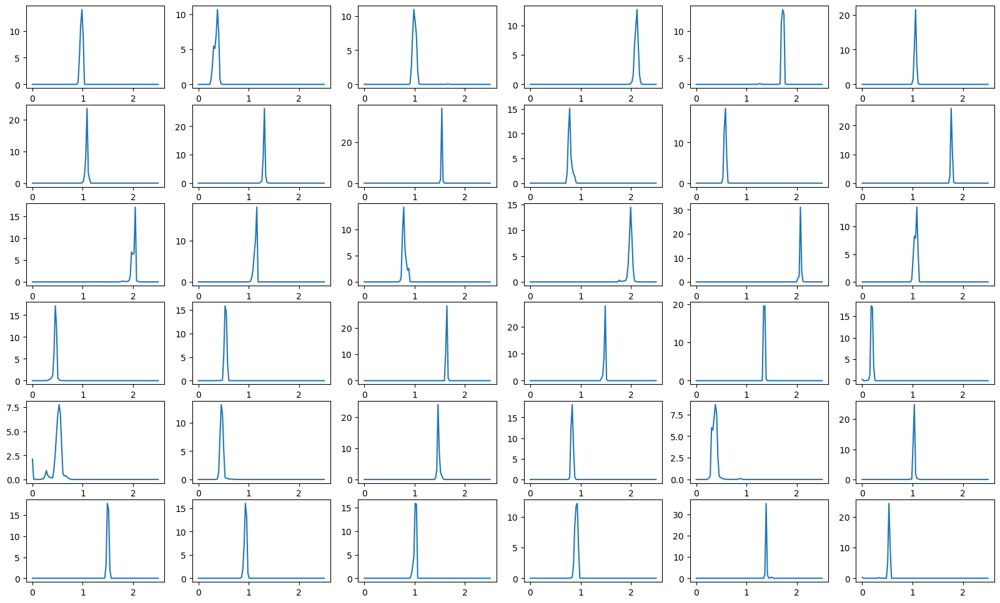

In [103]:
import matplotlib.pyplot as plt

fig, axes = plt.subplots(nrows = 6, ncols = 6, figsize = (20, 12)) 

ct = 0
for i in range(0, 6):
    for j in range(0, 6):
        axes[i][j].plot(orig_truth_xvals, orig_truth_yvals[ct])
        ct += 1

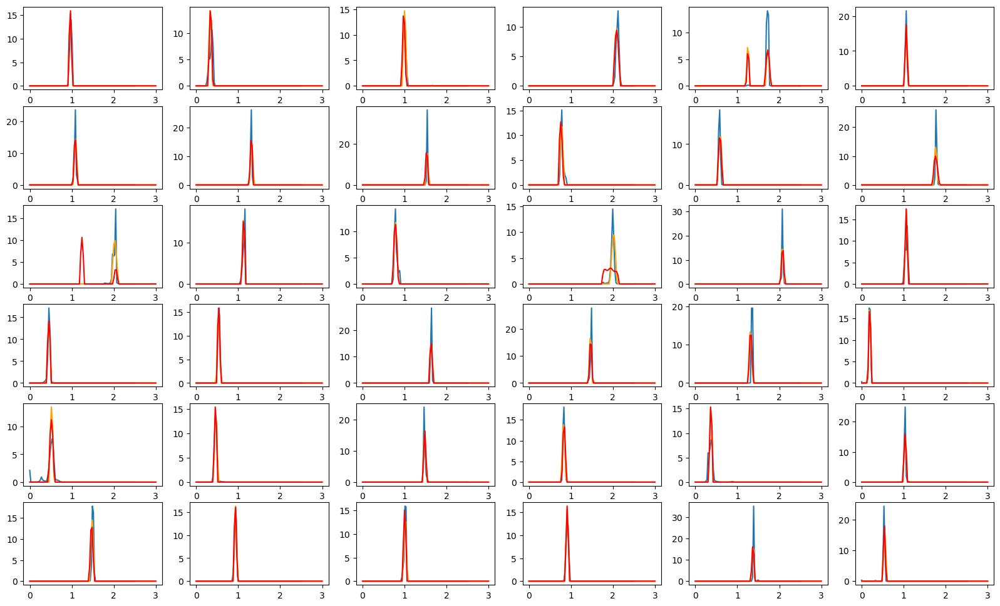

In [140]:
import matplotlib.pyplot as plt

fig, axes = plt.subplots(nrows = 6, ncols = 6, figsize = (20, 12)) 

ct = 0
for i in range(0, 6):
    for j in range(0, 6):
        axes[i][j].plot(orig_truth_xvals, orig_truth_yvals[ct])
        axes[i][j].plot(o_o_xvals, o_o_yvals[ct], color = 'orange')
        axes[i][j].plot(d_o_xvals, d_o_yvals[ct], color = 'red')
        ct += 1

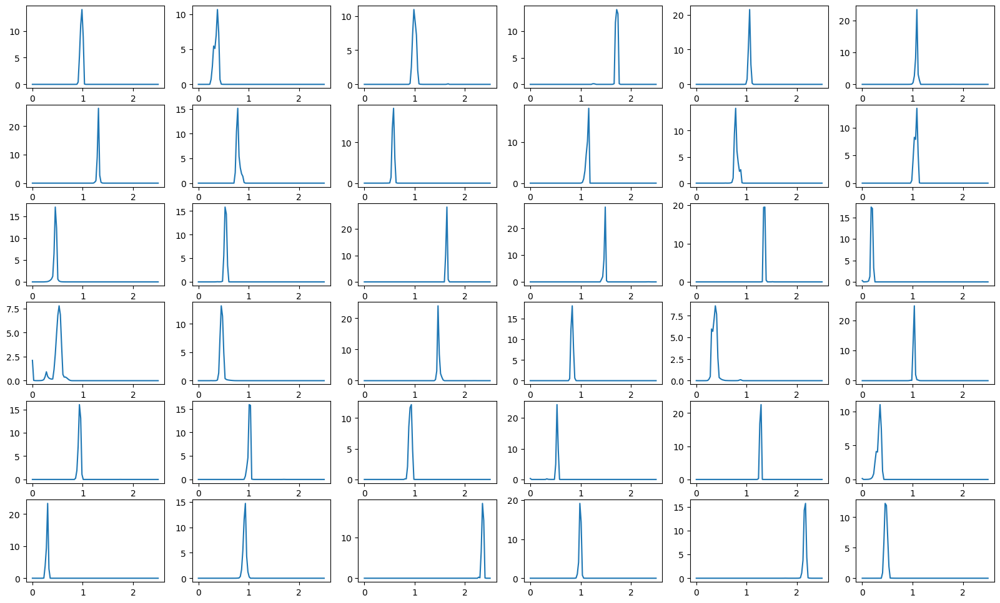

In [105]:
import matplotlib.pyplot as plt

fig, axes = plt.subplots(nrows = 6, ncols = 6, figsize = (20, 12)) 

ct = 0
for i in range(0, 6):
    for j in range(0, 6):
        axes[i][j].plot(deg_truth_xvals, deg_truth_yvals[ct])
        ct += 1

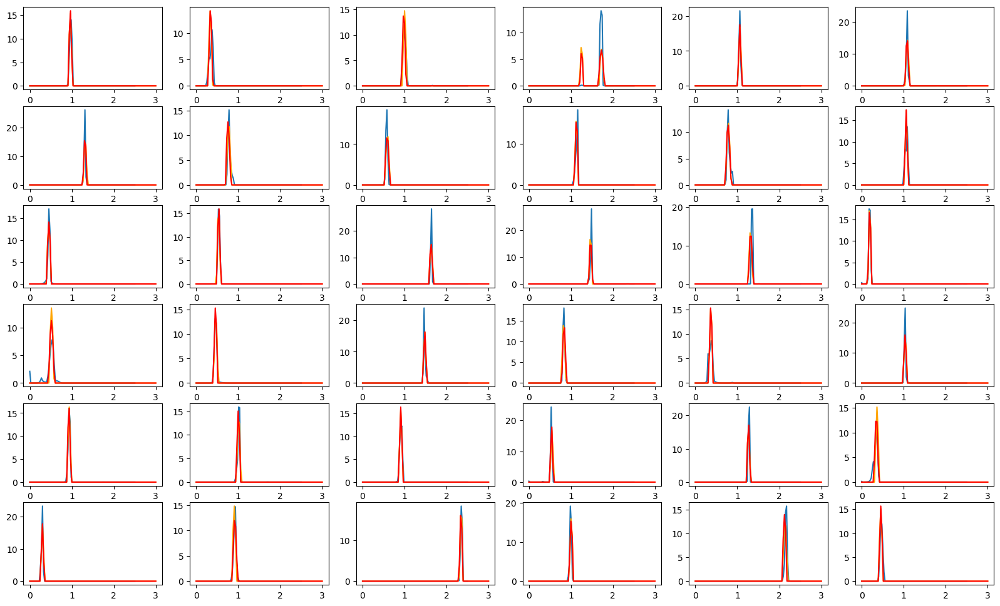

In [141]:
import matplotlib.pyplot as plt

fig, axes = plt.subplots(nrows = 6, ncols = 6, figsize = (20, 12)) 

ct = 0
for i in range(0, 6):
    for j in range(0, 6):
        axes[i][j].plot(deg_truth_xvals, deg_truth_yvals[ct])
        axes[i][j].plot(o_d_xvals, o_d_yvals[ct], color = 'orange')
        axes[i][j].plot(d_d_xvals, d_d_yvals[ct], color = 'red')
        ct += 1

# KLDs

In [110]:
o_o_klds = qp.metrics.calculate_kld(orig_truth_ens, o_o_ens, limits=lims, dx = grid[1] - grid[0])
print("KLDs:", o_o_klds)

broken KLD: (array([0.22058994, 2.13027887, 2.27512135, ..., 1.15528889, 0.30320484,
       0.36843443]), array([[7.88742524e-15, 1.24048723e-24, 1.17186381e-25, ...,
        8.26123490e-35, 8.51286481e-37, 0.00000000e+00],
       [3.17676054e-05, 1.00684214e-07, 1.77575954e-07, ...,
        4.19634944e-29, 4.37119734e-31, 2.45922483e-35],
       [2.65290289e-09, 6.73974580e-12, 1.83822342e-12, ...,
        1.55875162e-27, 3.07526627e-31, 1.44271725e-30],
       ...,
       [1.28690923e-15, 2.08364316e-17, 5.01590350e-17, ...,
        4.34666350e-17, 2.03715522e-21, 4.05796209e-22],
       [4.10283292e-08, 5.56244578e-17, 2.55133728e-17, ...,
        1.03147393e-20, 5.58433837e-22, 2.13528279e-24],
       [2.68640444e-13, 4.50722614e-17, 2.29827603e-16, ...,
        5.26297137e-33, 1.13920723e-33, 3.67737659e-34]]), array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [

In [26]:
o_d_klds = qp.metrics.calculate_kld(deg_truth_ens, o_d_ens, limits=lims, dx = grid[1] - grid[0])
print("KLDs:", o_d_klds)

broken KLD: (array([0.22058994, 2.13027887, 2.27512135, ..., 1.15528889, 0.30320484,
       0.36843443]), array([[7.88742524e-15, 1.24048723e-24, 1.17186381e-25, ...,
        8.26123490e-35, 8.51286481e-37, 0.00000000e+00],
       [3.17676054e-05, 1.00684214e-07, 1.77575954e-07, ...,
        4.19634944e-29, 4.37119734e-31, 2.45922483e-35],
       [2.65290289e-09, 6.73974580e-12, 1.83822342e-12, ...,
        1.55875162e-27, 3.07526627e-31, 1.44271725e-30],
       ...,
       [1.28690923e-15, 2.08364316e-17, 5.01590350e-17, ...,
        4.34666350e-17, 2.03715522e-21, 4.05796209e-22],
       [4.10283292e-08, 5.56244578e-17, 2.55133728e-17, ...,
        1.03147393e-20, 5.58433837e-22, 2.13528279e-24],
       [2.68640444e-13, 4.50722614e-17, 2.29827603e-16, ...,
        5.26297137e-33, 1.13920723e-33, 3.67737659e-34]]), array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [

In [27]:
d_o_klds = qp.metrics.calculate_kld(orig_truth_ens, d_o_ens, limits=lims, dx = grid[1] - grid[0])
print("KLDs:", d_o_klds)

broken KLD: (array([0.32843678, 1.88966956, 1.48704401, ..., 0.31288849, 0.31157887,
       0.36437705]), array([[7.88742524e-15, 1.24048723e-24, 1.17186381e-25, ...,
        8.26123490e-35, 8.51286481e-37, 0.00000000e+00],
       [3.17676054e-05, 1.00684214e-07, 1.77575954e-07, ...,
        4.19634944e-29, 4.37119734e-31, 2.45922483e-35],
       [2.65290289e-09, 6.73974580e-12, 1.83822342e-12, ...,
        1.55875162e-27, 3.07526627e-31, 1.44271725e-30],
       ...,
       [1.28690923e-15, 2.08364316e-17, 5.01590350e-17, ...,
        4.34666350e-17, 2.03715522e-21, 4.05796209e-22],
       [4.10283292e-08, 5.56244578e-17, 2.55133728e-17, ...,
        1.03147393e-20, 5.58433837e-22, 2.13528279e-24],
       [2.68640444e-13, 4.50722614e-17, 2.29827603e-16, ...,
        5.26297137e-33, 1.13920723e-33, 3.67737659e-34]]), array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [

In [28]:
d_d_klds = qp.metrics.calculate_kld(deg_truth_ens, d_d_ens, limits=lims, dx = grid[1] - grid[0])
print("KLDs:", d_d_klds)

broken KLD: (array([0.32843678, 1.88966956, 1.48704401, ..., 0.31288849, 0.31157887,
       0.36437705]), array([[7.88742524e-15, 1.24048723e-24, 1.17186381e-25, ...,
        8.26123490e-35, 8.51286481e-37, 0.00000000e+00],
       [3.17676054e-05, 1.00684214e-07, 1.77575954e-07, ...,
        4.19634944e-29, 4.37119734e-31, 2.45922483e-35],
       [2.65290289e-09, 6.73974580e-12, 1.83822342e-12, ...,
        1.55875162e-27, 3.07526627e-31, 1.44271725e-30],
       ...,
       [1.28690923e-15, 2.08364316e-17, 5.01590350e-17, ...,
        4.34666350e-17, 2.03715522e-21, 4.05796209e-22],
       [4.10283292e-08, 5.56244578e-17, 2.55133728e-17, ...,
        1.03147393e-20, 5.58433837e-22, 2.13528279e-24],
       [2.68640444e-13, 4.50722614e-17, 2.29827603e-16, ...,
        5.26297137e-33, 1.13920723e-33, 3.67737659e-34]]), array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [

# PIT

In [111]:
from qp.metrics.pit import PIT

o_o_pits = PIT(o_o_file(), np.asarray(orig_table)[:,0])
o_o_pit = o_o_pits._pit_samps 

In [112]:
o_d_pits = PIT(o_d_file(), np.asarray(deg_table)[:,0])
o_d_pit = o_d_pits._pit_samps 

In [113]:
d_o_pits = PIT(d_o_file(), np.asarray(orig_table)[:,0])
d_o_pit = d_o_pits._pit_samps 

In [143]:
d_d_pits = PIT(d_d_file(), np.asarray(deg_table)[:,0])
d_d_pit = d_d_pits._pit_samps 

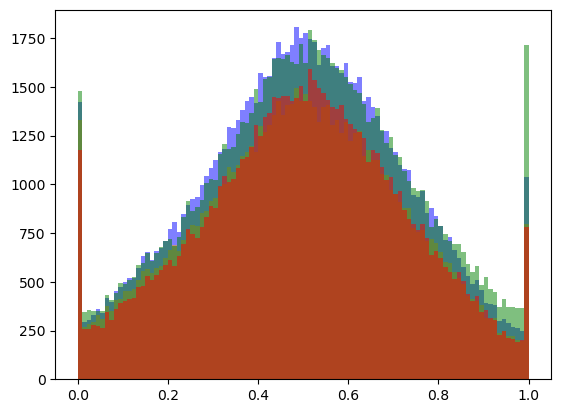

In [180]:
a = plt.hist(o_o_pit, bins = 100, alpha = 0.5, color = 'blue', label = 'o_o')
b = plt.hist(o_d_pit, bins = 100, alpha = 0.5, color = 'orange', label = 'o_d')
c = plt.hist(d_o_pit, bins = 100, alpha = 0.5, color = 'green', label = 'd_o')
d = plt.hist(d_d_pit, bins = 100, alpha = 0.5, color = 'red', label = 'd_d')
#handles, labels = plt.get_legend_handles_labels()
#plt.legend(handles = [a, b, c, d])

(0.0, 1850.0)

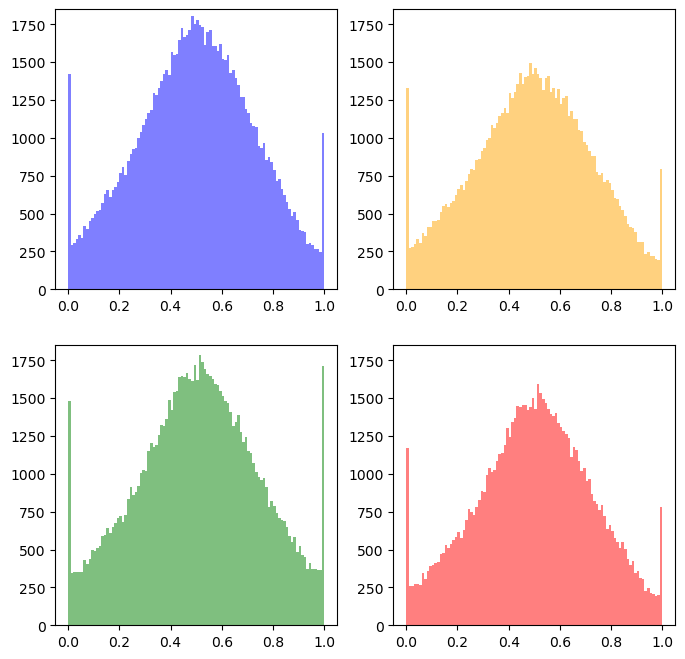

In [183]:
fig, axes = plt.subplots(nrows = 2, ncols = 2, figsize = (8, 8))
axes[0][0].hist(o_o_pit, bins = 100, alpha = 0.5, color = 'blue', label = 'o_o')
axes[0][1].hist(o_d_pit, bins = 100, alpha = 0.5, color = 'orange', label = 'o_d')
axes[1][0].hist(d_o_pit, bins = 100, alpha = 0.5, color = 'green', label = 'd_o')
axes[1][1].hist(d_d_pit, bins = 100, alpha = 0.5, color = 'red', label = 'd_d')

axes[0][0].set_ylim(0, 1850)
axes[0][1].set_ylim(0, 1850)
axes[1][0].set_ylim(0, 1850)
axes[1][1].set_ylim(0, 1850)

In [172]:
print('o_o outlier rate is:', (a[0][0] + a[0][-1]) / np.sum(a[0]) * 100, '%')
print('o_d outlier rate is:', (b[0][0] + b[0][-1]) / np.sum(b[0]) * 100, '%')
print('d_o outlier rate is:', (c[0][0] + c[0][-1]) / np.sum(c[0]) * 100, '%')
print('d_d outlier rate is:', (d[0][0] + d[0][-1]) / np.sum(d[0]) * 100, '%')

o_o outlier rate is: 2.456 %
o_d outlier rate is: 2.553365581305802 %
d_o outlier rate is: 3.1919999999999997 %
d_d outlier rate is: 2.353620677207422 %


# Outlier Rejection 

In [147]:
import numpy as np
from scipy import stats
from scipy.stats import norm

def getMeans(tuple):
    means = []
    for i in range(len(tuple[1])):
        mean = np.sum(tuple[0] * tuple[1][i]) / np.sum(tuple[1][i])
        means.append(mean)
    return np.asarray(means)
        # var = np.sum((mean - ens[0])**2 * ens[1][i]) / np.sum(ens[1][i])

def outlierRejection(ls, lim):
    mean = np.mean(ls)
    stdev = stats.tstd(ls)
    ct = 0
    for i in ls:
        if np.abs(mean - i) > 3*stdev:
            ls.remove(i) 
            ct += 1
    if ct <= lim:
        return ls
    else:
        return outlierRejection(ls, lim)

In [148]:
o_o_f = h5py.File('output_est_fzboost_o_o.hdf5', 'r')
list(o_o_f.keys())

o_o_ancil = o_o_f['ancil']
o_o_data = o_o_f['data']
o_o_meta = o_o_f['meta']

o_o_zmode = o_o_ancil['zmode']
o_o_yvals = np.asarray(o_o_data['yvals'])
o_o_xvals = np.asarray(o_o_meta['xvals'])[0]

o_o_means = getMeans([o_o_xvals, o_o_yvals])


100000


In [149]:
o_d_f = h5py.File('output_est_fzboost_o_d.hdf5', 'r')
list(o_d_f.keys())

o_d_ancil = o_d_f['ancil']
o_d_data = o_d_f['data']
o_d_meta = o_d_f['meta']

o_d_zmode = o_d_ancil['zmode']
o_d_yvals = np.asarray(o_d_data['yvals'])
o_d_xvals = np.asarray(o_d_meta['xvals'])[0]

o_d_means = getMeans([o_d_xvals, o_d_yvals])

In [150]:
d_o_f = h5py.File('output_est_fzboost_d_o.hdf5', 'r')
list(d_o_f.keys())

d_o_ancil = d_o_f['ancil']
d_o_data = d_o_f['data']
d_o_meta = d_o_f['meta']

d_o_zmode = d_o_ancil['zmode']
d_o_yvals = np.asarray(d_o_data['yvals'])
d_o_xvals = np.asarray(d_o_meta['xvals'])[0]

d_o_means = getMeans([d_o_xvals, d_o_yvals])

In [151]:
d_d_f = h5py.File('output_est_fzboost_d_d.hdf5', 'r')
list(d_d_f.keys())

d_d_ancil = d_d_f['ancil']
d_d_data = d_d_f['data']
d_d_meta = d_d_f['meta']

d_d_zmode = d_d_ancil['zmode']
d_d_yvals = np.asarray(d_d_data['yvals'])
d_d_xvals = np.asarray(d_d_meta['xvals'])[0]

d_d_means = getMeans([d_d_xvals, d_d_yvals])

In [152]:
o_o_true_z = np.asarray(orig_table)[:,0]

o_o_diff = np.asarray(o_o_true_z - o_o_means)

o_o_oR = outlierRejection(o_o_diff.tolist(), 0)

print(o_o_oR)

o_o_inds = []
for i in range(len(o_o_oR)):
    o_o_inds.append(np.where(o_o_diff == o_o_oR[i])[0][0])
print(o_o_inds)

o_o_kept = []
o_o_kept_z = []
for i in o_o_inds:
    o_o_kept.append(o_o_means[i])
    o_o_kept_z.append(o_o_true_z[i])
o_o_kept = np.asarray(o_o_kept)
o_o_kept_z= np.asarray(o_o_kept_z)

[0.014177570094088376, 0.001527754888504318, 0.056836746324177456, -0.0028221772420522484, -0.01293485758648405, -0.013089139073665157, 0.01203227345897906, 0.0013783563677280952, 0.05494312490427833, -0.027764650579541472, 0.019030279396497374, -0.0178146492030149, -0.01385614469936658, -0.006618121449992409, 0.014281152881892467, 0.020141049340923534, -0.035327012105798694, -0.033707942058764484, 0.04485145306560501, 0.005638667703621536, 0.0022910793621819803, 0.038650460888956406, 0.015830056585919322, -0.030105523298570303, -0.011805451455975557, 0.0074148089011878415, 0.010272874589759895, -0.0008259146058334221, -0.014053854754760398, -0.03404230617438497, -0.002415477244375408, -0.002563047193904544, 9.935897443047459e-05, -0.014977484803721297, 0.0011270182040017396, -0.029886505257572527, 0.004894064296621925, -0.013251609802656272, -0.028220897904162046, 0.005065816086743169, 0.010054538491891973, -0.008762059476860262, 0.05456436162347644, -0.012084483752952513, 0.018184929

In [153]:
o_d_true_z = np.asarray(deg_table)[:,0]

o_d_diff = np.asarray(o_d_true_z - o_d_means)

o_d_oR = outlierRejection(o_d_diff.tolist(), 0)

print(o_d_oR)

o_d_inds = []
for i in range(len(o_d_oR)):
    o_d_inds.append(np.where(o_d_diff == o_d_oR[i])[0][0])
print(o_d_inds)

o_d_kept = []
o_d_kept_z = []
for i in o_d_inds:
    o_d_kept.append(o_d_means[i])
    o_d_kept_z.append(o_d_true_z[i])
o_d_kept = np.asarray(o_d_kept)
o_d_kept_z= np.asarray(o_d_kept_z)

[0.014177570094088376, 0.001527754888504318, 0.056836746324177456, -0.01293485758648405, -0.013089139073665157, 0.01203227345897906, 0.05494312490427833, -0.027764650579541472, -0.01385614469936658, -0.006618121449992409, -0.035327012105798694, -0.033707942058764484, 0.04485145306560501, 0.005638667703621536, 0.0022910793621819803, 0.038650460888956406, 0.015830056585919322, -0.030105523298570303, -0.011805451455975557, 0.0074148089011878415, 0.010272874589759895, -0.0008259146058334221, -0.03404230617438497, -0.002415477244375408, -0.002563047193904544, -0.014977484803721297, 0.0011270182040017396, 0.004894064296621925, -0.013251609802656272, 0.005065816086743169, 0.010054538491891973, -0.008762059476860262, 0.05456436162347644, -0.012084483752952513, 0.01818492957451978, 0.005891353388846832, -0.007220251374640885, 0.0258202449898024, 0.0008186368146789746, 0.028272419118983816, 0.0030658135561152378, -0.021002104960599954, 0.02145315552598337, -0.02943345954541643, -0.01861550813846

In [154]:
d_o_true_z = np.asarray(orig_table)[:,0]

d_o_diff = np.asarray(d_o_true_z - d_o_means)

d_o_oR = outlierRejection(d_o_diff.tolist(), 0)

print(d_o_oR)

d_o_inds = []
for i in range(len(d_o_oR)):
    d_o_inds.append(np.where(d_o_diff == d_o_oR[i])[0][0])
print(d_o_inds)

d_o_kept = []
d_o_kept_z = []
for i in d_o_inds:
    d_o_kept.append(d_o_means[i])
    d_o_kept_z.append(d_o_true_z[i])
d_o_kept = np.asarray(d_o_kept)
d_o_kept_z= np.asarray(d_o_kept_z)

[0.014819932923390455, -0.004734137164307262, -0.003640666696810957, -0.00925765834291159, -0.006696574879384576, 0.021473831311339397, 0.013913371957717802, -0.023017258038859567, 0.0199522939737935, -0.015596315729587085, -0.0039761035232029895, 0.014793278830329992, -0.032603746193842875, -0.03635775879097314, 0.03817057717629746, 0.00813360205654079, -0.0004537903931862708, 0.03167894608576938, 0.01749311229015163, -0.027397997033770438, -0.003415083101766081, 0.005232913357032132, -0.0025673698454009575, -0.00012279506229212478, -0.0011033438008012375, -0.028954302370801654, 0.007597399330772969, -0.0024527051187946958, 0.005206022993739401, -0.006376159672043857, 0.00257341791256116, -0.029323605472329373, -0.04715535761653605, 0.008069883516997112, -0.02714252175200771, 0.010020101051395613, 0.0111006661063906, 0.004355011905911699, 0.052234156992988945, 0.006931226371176269, 0.011686947538891546, -0.010558848459590875, -0.005143112672541195, 0.027357816883864405, 0.002887099087

In [155]:
d_d_true_z = np.asarray(deg_table)[:,0]

d_d_diff = np.asarray(d_d_true_z - d_d_means)

d_d_oR = outlierRejection(d_d_diff.tolist(), 0)

print(d_d_oR)

d_d_inds = []
for i in range(len(d_d_oR)):
    d_d_inds.append(np.where(d_d_diff == d_d_oR[i])[0][0])
print(d_d_inds)

d_d_kept = []
d_d_kept_z = []
for i in d_d_inds:
    d_d_kept.append(d_d_means[i])
    d_d_kept_z.append(d_d_true_z[i])
d_d_kept = np.asarray(d_d_kept)
d_d_kept_z= np.asarray(d_d_kept_z)

[0.014819932923390455, -0.004734137164307262, -0.00925765834291159, -0.006696574879384576, 0.021473831311339397, -0.023017258038859567, -0.015596315729587085, -0.0039761035232029895, -0.032603746193842875, -0.03635775879097314, 0.03817057717629746, 0.00813360205654079, -0.0004537903931862708, 0.03167894608576938, 0.01749311229015163, -0.027397997033770438, -0.003415083101766081, 0.005232913357032132, -0.0025673698454009575, -0.00012279506229212478, -0.028954302370801654, 0.007597399330772969, -0.0024527051187946958, -0.006376159672043857, 0.00257341791256116, -0.04715535761653605, 0.008069883516997112, -0.02714252175200771, 0.010020101051395613, 0.0111006661063906, 0.004355011905911699, 0.052234156992988945, 0.006931226371176269, 0.011686947538891546, -0.010558848459590875, -0.005143112672541195, 0.027357816883864405, 0.002887099087525269, -0.021021456680449635, -0.009384717259545816, -0.040605946092229894, -0.02936623545171413, 0.035247950264645, 0.016501725475923434, 0.02147904050220

In [156]:
print(((len(o_o_means) - len(o_o_kept)) / len(o_o_means)) * 100)

print(((len(o_d_means) - len(o_d_kept)) / len(o_d_means)) * 100)

print(((len(d_o_means) - len(d_o_kept)) / len(d_o_means)) * 100)

print(((len(d_d_means) - len(d_d_kept)) / len(d_d_means)) * 100)


5.698
5.479748754602555
7.063999999999999
5.749284046879889


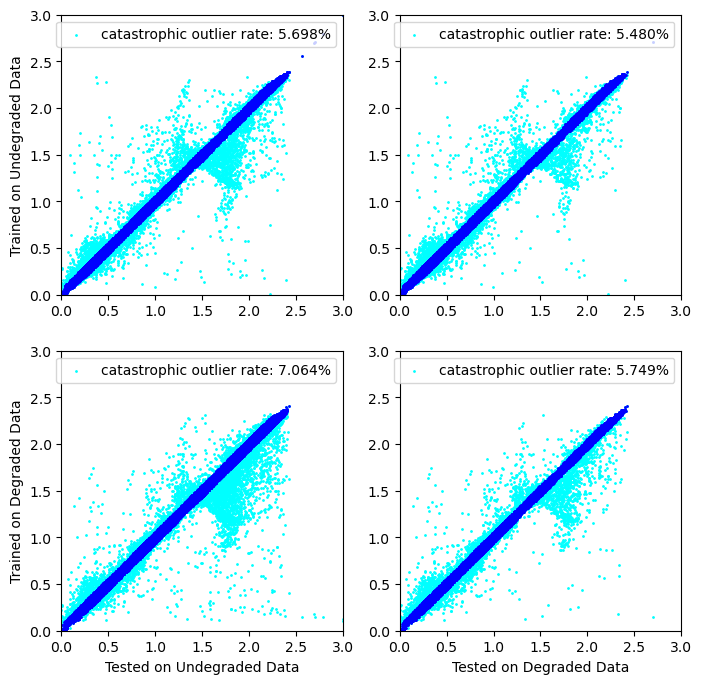

In [171]:
import matplotlib.pyplot as plt

fig, axes = plt.subplots(nrows = 2, ncols = 2, figsize = (8, 8))
axes[0][0].scatter(o_o_true_z, o_o_means, s = 1, color = 'cyan', label = 'catastrophic outlier rate: 5.698%')
axes[0][0].scatter(o_o_kept_z, o_o_kept, s = 1, color = 'blue')

axes[0][1].scatter(o_d_true_z, o_d_means, s = 1, color = 'cyan', label = 'catastrophic outlier rate: 5.480%')
axes[0][1].scatter(o_d_kept_z, o_d_kept, s = 1, color = 'blue')

axes[1][0].scatter(d_o_true_z, d_o_means, s = 1, color = 'cyan', label = 'catastrophic outlier rate: 7.064%')
axes[1][0].scatter(d_o_kept_z, d_o_kept, s = 1, color = 'blue')

axes[1][1].scatter(d_d_true_z, d_d_means, s = 1, color = 'cyan', label = 'catastrophic outlier rate: 5.749%')
axes[1][1].scatter(d_d_kept_z, d_d_kept, s = 1, color = 'blue')

axes[0][0].set_ylabel("Trained on Undegraded Data")
axes[1][0].set_ylabel("Trained on Degraded Data")
axes[1][0].set_xlabel("Tested on Undegraded Data")
axes[1][1].set_xlabel("Tested on Degraded Data")

axes[0][0].set_xlim(0, 3)
axes[0][1].set_xlim(0, 3)
axes[1][0].set_xlim(0, 3)
axes[1][1].set_xlim(0, 3)

axes[0][0].set_ylim(0, 3)
axes[0][1].set_ylim(0, 3)
axes[1][0].set_ylim(0, 3)
axes[1][1].set_ylim(0, 3)

handles1, labels1 = axes[0][0].get_legend_handles_labels()
axes[0][0].legend(handles1, labels1)
handles2, labels2 = axes[0][1].get_legend_handles_labels()
axes[0][1].legend(handles2, labels2)
handles3, labels3 = axes[1][0].get_legend_handles_labels()
axes[1][0].legend(handles3, labels3)
handles4, labels4 = axes[1][1].get_legend_handles_labels()
axes[1][1].legend(handles4, labels4)